
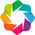

In [1]:
import numpy as np
import pandas as pd
import os
import datetime
from IPython import display

import holoviews as hv
hv.extension('bokeh')

from ipywidgets import widgets
from ipywidgets.widgets import interact, interactive, fixed
from ipywidgets import *

from __future__ import print_function
from ipyleaflet import (
    Map,
    Marker,
    TileLayer, ImageOverlay,
    Polyline, Polygon, Rectangle, Circle, CircleMarker,
    GeoJSON,
    DrawControl
)
import geojson

import matplotlib as mpl
import matplotlib.cm
import matplotlib.colors

In [2]:
forecast = pd.read_csv("forecast_june_2016.csv", index_col=0)
trips_from_region = pd.read_csv("trips_from_region.csv", index_col=0)

In [3]:
trips_from_region = trips_from_region.loc[forecast.index]
trips_from_region.index = pd.to_datetime(trips_from_region.index)
forecast.index = pd.to_datetime(forecast.index)

In [4]:
df = trips_from_region.copy(deep=True)
df['time'] = trips_from_region.index
df.reset_index(inplace=True)

In [5]:
data = pd.DataFrame()
for r in trips_from_region.columns.values:    
    tmp = pd.DataFrame(columns = ['time', 'region', 'trips','1h_forecast','2h_forecast','3h_forecast','4h_forecast','5h_forecast','6h_forecast'])   
    tmp.time = df.time.values
    tmp.region = np.full(df.shape[0], r)
    tmp.trips = df[r].values
    tmp['1h_forecast'] = forecast[r+'_1h'].shift(1).values
    tmp['2h_forecast'] = forecast[r+'_2h'].shift(2).values
    tmp['3h_forecast'] = forecast[r+'_3h'].shift(3).values
    tmp['4h_forecast'] = forecast[r+'_4h'].shift(4).values
    tmp['5h_forecast'] = forecast[r+'_5h'].shift(5).values
    tmp['6h_forecast'] = forecast[r+'_6h'].shift(6).values
    data = data.append(tmp)

In [6]:
key_dimensions   = [('time', u'Время'), ('region', u'Район')]
value_dimensions = [('trips', u'Количество поездок'), ('1h_forecast', 'Forecast on 1 hour'),('2h_forecast', 'Forecast on 2 hours'),
                   ('3h_forecast', 'Forecast on 3 hours'),('4h_forecast', 'Forecast on 4 hours'),
                   ('5h_forecast', 'Forecast on 5 hours'),('6h_forecast', 'Forecast on 6 hours'),]
ds = hv.Dataset(data, kdims=key_dimensions, vdims=value_dimensions)

In [7]:
%%opts Curve [width=400 height=300] (color='b')
%%opts Curve.Forecast1h [width=400 height=300] (color='m')
%%opts Curve.Forecast2h [width=400 height=300] (color='g')
%%opts Curve.Forecast3h [width=400 height=300] (color='r')
%%opts Curve.Forecast4h [width=400 height=300] (color='c')
%%opts Curve.Forecast5h [width=400 height=300] (color='y')
%%opts Curve.Forecast6h [width=400 height=300] (color='k')
%%opts Text (text_font_size='13px')
true_data_curve = ds.to.curve(u'Время', u'Количество поездок', label=u'Актуальные данные')
forecast_1h_curve = ds.to.curve(u'Время', 'Forecast on 1 hour', label = u'Прогноз на 1 час', group='Forecast1h')
forecast_2h_curve = ds.to.curve(u'Время', 'Forecast on 2 hours', label = u'Прогноз на 2 часа', group='Forecast2h')
forecast_3h_curve = ds.to.curve(u'Время', 'Forecast on 3 hours', label = u'Прогноз на 3 часа', group='Forecast3h')
forecast_4h_curve = ds.to.curve(u'Время', 'Forecast on 4 hours', label = u'Прогноз на 4 часа', group='Forecast4h')
forecast_5h_curve = ds.to.curve(u'Время', 'Forecast on 5 hours', label = u'Прогноз на 5 часов', group='Forecast5h')
forecast_6h_curve = ds.to.curve(u'Время', 'Forecast on 6 hours', label = u'Прогноз на 6 часов', group='Forecast6h')

layout = true_data_curve*forecast_1h_curve*forecast_2h_curve*forecast_3h_curve*\
forecast_4h_curve*forecast_5h_curve*forecast_6h_curve

In [8]:
region_coords = pd.read_csv("regions.csv",sep=';', index_col=0)
region_coords = region_coords.loc[trips_from_region.columns.values.astype(int)]
region_names = region_coords.index.values

In [9]:
def data_to_colors(data, colormap=mpl.cm.viridis):
    c = [mpl.colors.rgb2hex(d[0:3]) for d in colormap(mpl.colors.Normalize(vmin=0, vmax=2200)(data))]
    return c

def data_to_layer(trips_data, feature_collection):

    colors = data_to_colors(trips_data)
    
    for feature, color in zip(feature_collection['features'], colors):
        feature['properties']['style'] = {'color':color, 'weight': 1, 'fillColor':color, 'fillOpacity':0.5}
    return feature_collection

def handle_time_change(sender):
    val = wg_data_selector.value
    if (val == 0):
        hour_row = trips_from_region.loc[wg_time_selector.value].values
    else:
        col_list = []
        for name in region_names:
            col_list.append(str(name) + '_'+str(val)+'h')
        hour_row = forecast.loc[wg_time_selector.value][col_list].values
    res = data_to_layer(hour_row, features)
    g = GeoJSON(data=res)
    if (len(m.layers)>1):
        m.remove_layer(m.layers[1])    
    m.add_layer(g)

In [10]:
features = []
for r in region_coords.iterrows():
    region_poly = [[[r[1]['west'], r[1]['south']],
                     [r[1]['west'], r[1]['north']],
                     [r[1]['east'], r[1]['north']],
                     [r[1]['east'], r[1]['south']],
                     [r[1]['west'], r[1]['south']]]]
    features.append(geojson.Feature(geometry=geojson.Polygon(region_poly),
                properties={}))    
features = geojson.FeatureCollection(features)

In [16]:
m = Map(center=[40.6974368,-74.0222464], zoom=10)

options = [(i.strftime("%d-%m-%Y %H:%M"), i) for i in trips_from_region.index]

wg_time_selector = widgets.SelectionSlider(
    options=options,  
    description='Time ',
    index=(0,trips_from_region.shape[0]),
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    layout=Layout(width='90%')
)

options = dict([(u'Актуальные данные',0),
               (u'Прогноз на 1 час',1),
               (u'Прогноз на 2 часа',2),
               (u'Прогноз на 3 часа',3),
               (u'Прогноз на 4 часа',4),
               (u'Прогноз на 5 часов',5),
               (u'Прогноз на 6 часов',6)])
wg_data_selector = widgets.Dropdown(
    options = options,
    value = 0,
    description = u'Выбор данных: ',
    layout=Layout(width='40%')
)

wg_data_selector.observe(handle_time_change)
wg_time_selector.observe(handle_time_change)

time_box = widgets.HBox([wg_time_selector])
data_selector_box = widgets.HBox([wg_data_selector])

In [12]:
%%output size=150
display.display(layout)

:HoloMap   [region]
   :Overlay
      .Curve.Cyrillic_A_cyrillic_ka_cyrillic_te_cyrillic_u_cyrillic_a_cyrillic_el_cyrillic_soft_cyrillic_en_cyrillic_yeru_cyrillic_ie_cyrillic_de_cyrillic_a_cyrillic_en_cyrillic_en_cyrillic_yeru_cyrillic_ie :Curve   [time]   (trips)
      .Forecast1h.Cyrillic_Pe_cyrillic_er_cyrillic_o_cyrillic_ghe_cyrillic_en_cyrillic_o_cyrillic_ze_cyrillic_en_cyrillic_a_1_cyrillic_che_cyrillic_a_cyrillic_es                                              :Curve   [time]   (1h_forecast)
      .Forecast2h.Cyrillic_Pe_cyrillic_er_cyrillic_o_cyrillic_ghe_cyrillic_en_cyrillic_o_cyrillic_ze_cyrillic_en_cyrillic_a_2_cyrillic_che_cyrillic_a_cyrillic_es_cyrillic_a                                   :Curve   [time]   (2h_forecast)
      .Forecast3h.Cyrillic_Pe_cyrillic_er_cyrillic_o_cyrillic_ghe_cyrillic_en_cyrillic_o_cyrillic_ze_cyrillic_en_cyrillic_a_3_cyrillic_che_cyrillic_a_cyrillic_es_cyrillic_a                                   :Curve   [time]   (3h_forecast)
      .Forecast4h.Cyrillic_Pe_cyrillic_er_cyrillic_o_cyrillic_ghe_cyrillic_en_cyrillic_o_cyrillic_ze_cyrillic_en_cyrillic_a_4_cyrillic_che_cyrillic_a_cyrillic_es_cyrillic_a                                   :Curve   [time]   (4h_forecast)
      .Forecast5h.Cyrillic_Pe_cyrillic_er_cyrillic_o_cyrillic_ghe_cyrillic_en_cyrillic_o_cyrillic_ze_cyrillic_en_cyrillic_a_5_cyrillic_che_cyrillic_a_cyrillic_es_cyrillic_o_cyrillic_ve                       :Curve   [time]   (5h_forecast)
      .Forecast6h.Cyrillic_Pe_cyrillic_er_cyrillic_o_cyrillic_ghe_cyrillic_en_cyrillic_o_cyrillic_ze_cyrillic_en_cyrillic_a_6_cyrillic_che_cyrillic_a_cyrillic_es_cyrillic_o_cyrillic_ve                       :Curve   [time]   (6h_forecast)

In [17]:
display.display(time_box)
display.display(data_selector_box)
display.display(m)